1. Data loaeding and preprocessing

In [1]:
# Loading and cleaning
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
import sys
sys.path.append(r'C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU') 
from helper_functions import * # Import Ruiwu's helper functions for data cleaning, slicing and aggregating

full_dataset = r"C:\Frank\UoT 2024-2025\MIE8888 Project\full_dataset_2.11.csv"
df = pd.read_csv(full_dataset, encoding="Windows-1252")

# Define trash columns
trash_columns = ['id_x_x','sikka_sub_task_operation_x_x','office_x_x','guarantor_x','patient','description','visible_to_patient','primary_insurance_estimate','secondary_insurance_estimate','plan_sr_no','insurance_payment','approved','from_pms_x_x','id_y_x','from_pms_y_x','sikka_sub_task_y_x','sikka_sub_task_operation_y_x','uuid','guarantor_y','office_y_x','fullname','first_name','last_name','address','phone','zip_code','practice','primary_insurance_company_id','profile_picture','date_joined','zip_code_flag','address_comp','final_zip_code','id_x_y','from_pms_x_y','office_x_y','treatment','id_y_y','from_pms_y_y','sikka_sub_task_y_y','sikka_sub_task_operation_y_y','office_y_y','procedure_code_x','procedure_code_description','patient_friendly_description','treatment_id','price','fetched_zip_code_flag','zip_code_verified','fetched_zip_code', 'entry_date', 'tooth_from']

df = drop_high_nan_columns(df) 
df = df.drop(columns = trash_columns) # Drop trash cols
df = merge_columns_with_priority(df,'health_category','procedure_code_category','treatment_category') # merge to get treatment_category with pattern from two category groups
df = df.dropna() # Drop the remaining NA
df, df_dict = object_processing(df) # Project columns dtype = object; For columns containing datetime, convert it to pd.datetime; For other object columns, encode them
df = days_cal(df,'procedure_date','birth_date', 'procedure_age') # age group preparation (modify to int)
df = days_cal(df,'last_visit','first_visit','visit_period')

# # Perform one-hot encoding on the "procedure_code_y" and "treatment_category"
df = one_hot_encode_procedure_and_treatment(df)
# df.to_csv(r'C:\Frank\UoT 2024-2025\MIE8888 Project\M18\output.csv', index=False)

df_next = df.copy() # for next step use

C:\Users\frank\AppData\Local\Temp\ipykernel_34836\2822141788.py:10: DtypeWarning: Columns (1,4,10,16,52,85,86,91) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv(full_dataset, encoding="Windows-1252")
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be parsed individually, falling back to `dateutil`. To ensure parsing is consistent and as-expected, please specify a format.
  temp_dt = pd.to_datetime(df[col], errors='raise')
C:\Frank\UoT 2024-2025\MIE8888 Project\M18\RUIWU\helper_functions.py:41: UserWarning: Could not infer format, so each element will be pa

2. Create a complete dataset to reflect each patient_id's treatment pattern (aassuming all meta columns stand the same for each unique patient id)

In [2]:
meta_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city','state_y', 'sikka_provider_id', 'LATITUDE', 'LONGITUDE', 'procedure_age', 'visit_period']

# Select relevant columns
base_cols = ['patient_id', 'procedure_age']
procedure_cols = [col for col in df_next.columns if col.startswith('procedure_code_y_') or col.startswith('treatment_category_')]
df_subset = df_next[base_cols + procedure_cols].copy()
df_subset['procedure_age'] = df_subset['procedure_age'].astype(int) # procedure_age to int

# Melt one-hot to long format
df_long = df_subset.melt(
    id_vars=['patient_id', 'procedure_age'],
    value_vars=procedure_cols,
    var_name='procedure_code',
    value_name='occurred'
)

# Keep only rows where procedure occurred
df_long = df_long[df_long['occurred'] == 1]

# Create combined feature name
df_long['feature'] = df_long['procedure_code'] + '_age' + df_long['procedure_age'].astype(str)

# Pivot to wide format
final_df = df_long.groupby(['patient_id', 'feature']).size().unstack(fill_value=0)
final_df = final_df.reset_index()

# Get metadata (take first row per patient) # may need further fixing if the information for such patient changed over times
patient_meta = df_next[meta_cols].groupby('patient_id').first().reset_index()
final_df = pd.merge(patient_meta, final_df, on='patient_id', how='left')

In [3]:
final_df

,patient_id,provider_x,amount,treatment_plan_status,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,treatment_category_9_age88,treatment_category_9_age89,treatment_category_9_age9,treatment_category_9_age90,treatment_category_9_age91,treatment_category_9_age92,treatment_category_9_age93,treatment_category_9_age95,treatment_category_9_age96,treatment_category_9_age99
0,1,1,663.00,1,0,0,0,43.818875,-79.559466,55,...,0,0,0,0,0,0,0,0,0,0
1,2,7,77.19,0,0,0,0,43.818875,-79.559466,41,...,0,0,0,0,0,0,0,0,0,0
2,3,5,19.96,0,0,0,0,43.818875,-79.559466,24,...,0,0,0,0,0,0,0,0,0,0
3,4,7,55.49,0,0,0,0,43.835469,-79.555076,15,...,0,0,0,0,0,0,0,0,0,0
4,5,1,220.00,1,0,0,0,43.818875,-79.559466,20,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,13579,10,8.75,1,0,0,0,43.838741,-79.563329,10,...,0,0,0,0,0,0,0,0,0,0
10254,13580,10,30.15,1,0,0,0,43.838741,-79.563329,6,...,0,0,0,0,0,0,0,0,0,0
10255,13583,11,160.14,0,12,0,0,43.840925,-79.551739,8,...,0,0,0,0,0,0,0,0,0,0
10256,13584,2,0.00,2,9,0,2,43.671953,-79.399170,39,...,0,0,0,0,0,0,0,0,0,0


Applied Truncated SVD which is the best for sparse binary data of large sparse matrices.

In [4]:
from sklearn.decomposition import TruncatedSVD
from scipy.sparse import csr_matrix

# columns to exclude from SVD
non_binary_cols = ['provider_x', 'amount', 'treatment_plan_status', 'patient_id', 'city','state_y', 'sikka_provider_id', 'LATITUDE', 'LONGITUDE','procedure_age', 'visit_period']
meta_df = final_df[non_binary_cols].copy()
binary_df = final_df.drop(columns=non_binary_cols)

# Apply TruncatedSVD on binary columns
X_sparse = csr_matrix(binary_df.values)
svd = TruncatedSVD(n_components=100, random_state=823)
X_svd = svd.fit_transform(X_sparse)

svd_features = pd.DataFrame(X_svd, columns=[f"SVD_{i+1}" for i in range(X_svd.shape[1])])
df_svd = pd.concat([meta_df.reset_index(drop=True), svd_features], axis=1)

In [5]:
df_svd

,provider_x,amount,treatment_plan_status,patient_id,city,state_y,sikka_provider_id,LATITUDE,LONGITUDE,procedure_age,...,SVD_91,SVD_92,SVD_93,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100
0,1,663.00,1,1,0,0,0,43.818875,-79.559466,55,...,0.129302,0.679257,-1.310237,0.418749,-0.268478,-0.459666,-0.326420,1.408708,0.994770,0.192471
1,7,77.19,0,2,0,0,0,43.818875,-79.559466,41,...,-0.654086,-0.537491,-1.120165,-1.128762,-1.012749,-0.084358,-0.711287,-0.395388,0.613275,0.074925
2,5,19.96,0,3,0,0,0,43.818875,-79.559466,24,...,-0.204574,0.109031,0.210161,0.171720,-0.255636,-0.013390,0.474894,0.300367,-0.243592,0.265608
3,7,55.49,0,4,0,0,0,43.835469,-79.555076,15,...,0.918200,0.409798,-0.146121,-0.312076,-0.171364,0.058218,-1.386143,-0.632145,-0.839857,1.715160
4,1,220.00,1,5,0,0,0,43.818875,-79.559466,20,...,-0.086875,0.040611,0.077501,-0.113327,0.063478,0.000552,-0.151971,0.158655,0.031298,0.016163
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10253,10,8.75,1,13579,0,0,0,43.838741,-79.563329,10,...,-0.068137,-0.276409,-0.101999,0.251203,0.078569,-0.247758,-0.088183,-0.133617,0.008568,-0.066537
10254,10,30.15,1,13580,0,0,0,43.838741,-79.563329,6,...,-0.121298,0.139158,-0.051260,0.559763,-0.378192,0.501527,0.180905,-0.128073,0.051764,-0.046494
10255,11,160.14,0,13583,12,0,0,43.840925,-79.551739,8,...,-0.036826,0.026531,0.019474,0.025020,0.052504,0.037267,0.025919,-0.034039,0.031956,-0.011931
10256,2,0.00,2,13584,9,0,2,43.671953,-79.399170,39,...,0.023530,0.026105,-0.016765,-0.005024,0.015098,0.032073,-0.010145,-0.012431,0.015550,0.046990


3. Dataframe for 17 age groups, start from 5-10, up to 85-90


In [6]:
def age_to_group(age):
    try:
        age = int(age)
        if age < 0:
            return "invalid"
        lower = (age // 5) * 5
        upper = lower + 5
        if lower > upper:
            return "invalid"
        return f"{lower}-{upper}"
    except:
        return "invalid"

df['age_group'] = df['procedure_age'].apply(age_to_group)

import os
# Create output directory if it doesn't exist
output_dir = r"C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe"
os.makedirs(output_dir, exist_ok=True)

# Split and save each group
for group_name, group_df in df.groupby('age_group'):
    filename = f"{output_dir}/age_group_{group_name}.csv"
    group_df.to_csv(filename, index=False)
    print(f"Saved: {filename}")

Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_0-5.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_10-15.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_15-20.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_20-25.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_25-30.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_30-35.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_35-40.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_40-45.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_45-50.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_5-10.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe/age_group_50-55.csv
Saved: C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split d

4. Clustering, using dataset age_30_35 as one example

In [7]:
df_30_35  = pd.read_csv(r"C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe\age_group_30-35.csv")
binary_cols = [col for col in df_30_35 .columns if (col.startswith('procedure_code_y_') or col.startswith('treatment_category_'))]

# Group by patient and aggregate with sum
agg_binary = df_30_35 .groupby("patient_id")[binary_cols].sum()

# Combine each patient's SVD with their age-group treatments
df_combined = pd.merge(agg_binary, df_svd, on='patient_id', how='left') # keep all patients from your age group and match SVD if available

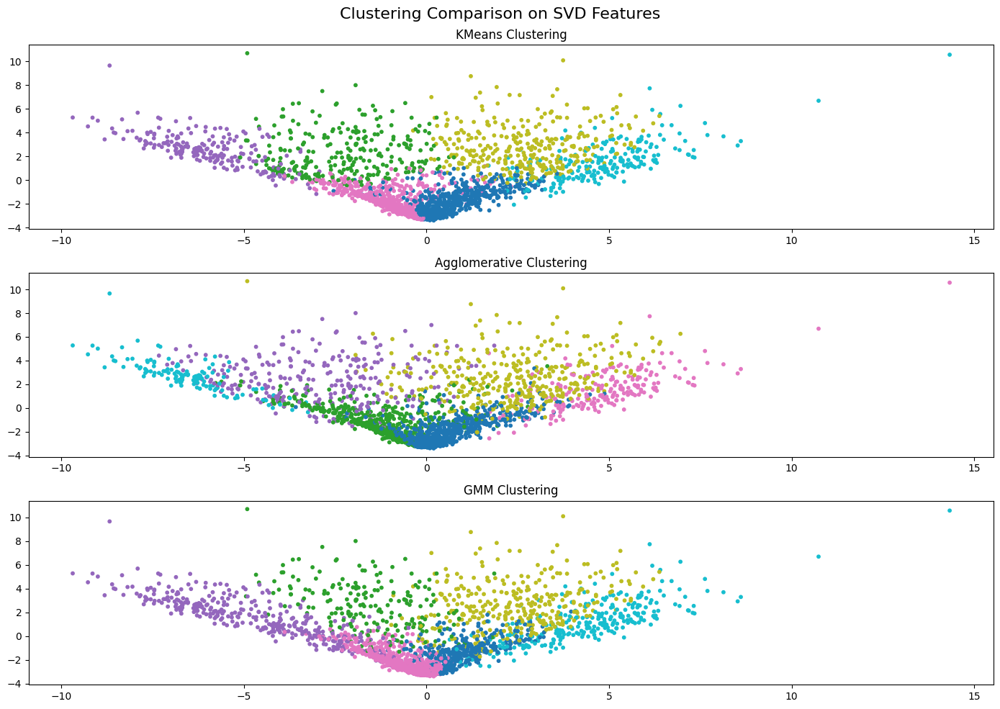

In [11]:
from sklearn.cluster import KMeans, AgglomerativeClustering
from sklearn.mixture import GaussianMixture
from sklearn.decomposition import PCA

svd_cols = [col for col in df_combined.columns if col.startswith("SVD_")]
X = df_combined[svd_cols]

# Dimensionality reduction for visualization (PCA)
pca = PCA(n_components=2)
X_vis = pca.fit_transform(X)

# different clustering algorithms
clustering_methods = {
    'KMeans': KMeans(n_clusters=6, random_state=823),
    'Agglomerative': AgglomerativeClustering(n_clusters=6),
    'GMM': GaussianMixture(n_components=6, random_state=823)
}

fig, axes = plt.subplots(3, 1, figsize=(14, 10))
axes = axes.flatten()
for i, (name, model) in enumerate(clustering_methods.items()):
    labels = model.fit_predict(X)
    df_combined[f'{name}_cluster'] = labels

    # Plot
    axes[i].scatter(X_vis[:, 0], X_vis[:, 1], c=labels, cmap='tab10', s=10)
    axes[i].set_title(f"{name} Clustering")

plt.suptitle("Clustering Comparison on SVD Features", fontsize=16)
plt.tight_layout()
plt.show()


- KMeans baseline  
Baseline clustering model fast and interpretable.  

- Gaussian Mixture Model (GMM) for soft, overlapping patterns  
Patient histories may overlap.  
Can model elliptical clusters, good for reduced features (like SVD).  
Helps find blurry boundaries.  

- Agglomerative Clustering for interpretable structure  
Good for visualizing treatment relationships or creating treatment hierarchies.  
Reveals hierarchical structure — can be useful if patient groups nest within others.  
Good for understanding group similarity.  

In [21]:
df_combined

,patient_id,procedure_code_y_1011,procedure_code_y_1101,procedure_code_y_1102,procedure_code_y_1103,procedure_code_y_1104,procedure_code_y_1105,procedure_code_y_1110,procedure_code_y_1120,procedure_code_y_1130,...,SVD_94,SVD_95,SVD_96,SVD_97,SVD_98,SVD_99,SVD_100,KMeans_cluster,Agglomerative_cluster,GMM_cluster
0,4,0,0,0,0,0,0,0,0,0,...,-0.312076,-0.171364,0.058218,-1.386143,-0.632145,-0.839857,1.715160,1,2,1
1,9,0,0,0,1,0,0,0,0,0,...,-0.468354,-0.326590,0.663494,-0.990135,0.546670,-0.863540,0.211356,0,0,5
2,10,0,0,0,1,0,0,0,0,0,...,0.209321,0.211746,-0.399344,-0.642760,1.017964,-0.318342,-0.579998,0,0,5
3,15,0,0,0,0,0,0,0,0,0,...,0.494609,0.421419,0.042029,0.345710,0.664593,-0.397086,-0.745633,0,0,3
4,16,0,0,0,0,0,0,0,0,0,...,0.149938,-0.979195,-0.822685,-0.300501,-0.819922,0.567596,1.437757,1,1,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2273,13457,0,0,0,1,0,0,0,0,0,...,-0.189118,0.232147,0.694559,0.227652,-0.121029,0.521791,0.478887,0,0,3
2274,13458,0,0,0,1,0,0,0,0,0,...,0.039891,0.427698,0.691202,0.366608,-0.452296,0.624582,1.049860,0,0,3
2275,13497,0,0,0,1,0,0,0,0,0,...,0.098907,-0.207055,0.267142,0.266479,-0.070170,0.166963,-0.098539,3,0,3
2276,13523,0,0,0,3,0,0,0,0,0,...,0.352623,-0.550863,0.589266,0.663459,-0.121129,0.412285,-0.205060,3,0,3


5. Using clustering information and loop through future csv. of age groups

In [24]:
def get_patient_trajectories(cluster_label_col, selected_cluster, current_df, future_age_files_folder, future_age_groups):
    """
    Track treatment trajectories for patients in a given cluster across future age groups.
    
    cluster_label_col: str — e.g., 'cluster_kmeans'
    selected_cluster: int — e.g., 1
    current_df: pd.DataFrame — the clustered df_combined for current age group
    future_age_files_folder: str — folder containing age_group_XX-YY.csv files
    future_age_groups: list[str] — e.g., ['35-40', '40-45']

    """

    cluster_patients = current_df[current_df[cluster_label_col] == selected_cluster]['patient_id'].unique()
    patient_trajectories = {}

    for id in cluster_patients:
        trajectory = []

        for group in future_age_groups:
            file_path = os.path.join(future_age_files_folder, f"age_group_{group}.csv")
            if not os.path.exists(file_path):
                continue

            df = pd.read_csv(file_path)
            df_patient = df[df['patient_id'] == id]

            if df_patient.empty:
                continue

            proc_cols = [col for col in df_patient.columns if col.startswith("procedure_code_y_")]
            procedures = df_patient[proc_cols].sum()
            procedures = procedures[procedures > 0].index.tolist()
            trajectory.append((group, procedures))

        patient_trajectories[id] = trajectory

    return patient_trajectories

In [ ]:
trajectories = get_patient_trajectories(
    cluster_label_col='KMeans_cluster',
    selected_cluster=1,
    current_df=df_combined,
    future_age_files_folder=r"C:\Frank\UoT 2024-2025\MIE8888 Project\M18\Split dataframe",
    future_age_groups=['35-40', '40-45', '45-50']
)

[('35-40', ['procedure_code_y_1202', 'procedure_code_y_2114', 'procedure_code_y_2601', 'procedure_code_y_11112', 'procedure_code_y_11114', 'procedure_code_y_11117', 'procedure_code_y_23321']), ('40-45', ['procedure_code_y_1103', 'procedure_code_y_1202', 'procedure_code_y_2111', 'procedure_code_y_2122', 'procedure_code_y_2141', 'procedure_code_y_2144', 'procedure_code_y_2601', 'procedure_code_y_11101', 'procedure_code_y_11107', 'procedure_code_y_11112', 'procedure_code_y_11113', 'procedure_code_y_11117', 'procedure_code_y_12101', 'procedure_code_y_23321', 'procedure_code_y_23322', 'procedure_code_y_23323']), ('45-50', ['procedure_code_y_11114', 'procedure_code_y_12111'])]


In [32]:
trajectories

{4: [('35-40',
   ['procedure_code_y_1202',
    'procedure_code_y_2114',
    'procedure_code_y_2601',
    'procedure_code_y_11112',
    'procedure_code_y_11114',
    'procedure_code_y_11117',
    'procedure_code_y_23321']),
  ('40-45',
   ['procedure_code_y_1103',
    'procedure_code_y_1202',
    'procedure_code_y_2111',
    'procedure_code_y_2122',
    'procedure_code_y_2141',
    'procedure_code_y_2144',
    'procedure_code_y_2601',
    'procedure_code_y_11101',
    'procedure_code_y_11107',
    'procedure_code_y_11112',
    'procedure_code_y_11113',
    'procedure_code_y_11117',
    'procedure_code_y_12101',
    'procedure_code_y_23321',
    'procedure_code_y_23322',
    'procedure_code_y_23323']),
  ('45-50', ['procedure_code_y_11114', 'procedure_code_y_12111'])],
 16: [('35-40',
   ['procedure_code_y_1202',
    'procedure_code_y_2114',
    'procedure_code_y_2601',
    'procedure_code_y_11101',
    'procedure_code_y_11107',
    'procedure_code_y_11113',
    'procedure_code_y_11117'

6. Summarize the Top 5 Most Common Future Treatments

In [ ]:
from collections import Counter

def summarize_procedures(trajectories):
    """
    Count and return the top 5 most common procedures from all patient trajectories.
    """
    procedure_counter = Counter()

    for patient_id, sequence in trajectories.items():
        for age_group, procedures in sequence:
            procedure_counter.update(procedures)

    return procedure_counter.most_common(5)


In [36]:
top_procedures = summarize_procedures(trajectories)
print(top_procedures)

[('procedure_code_y_1202', 284), ('procedure_code_y_11113', 280), ('procedure_code_y_11107', 219), ('procedure_code_y_2144', 184), ('procedure_code_y_11117', 176)]


7. Visualize a Single Patient’s Timeline

In [ ]:
def visualize_patient_timeline(patient_id, trajectory):
    """
    Plot a timeline of procedures for one patient across future age groups.
    """

    steps = [age_group for age_group, _ in trajectory]
    procedures = [", ".join([p.split("_")[-1] for p in proc]) if proc else "None" for _, proc in trajectory]
    plt.figure(figsize=(12, 3))
    plt.plot(range(len(steps)), [1] * len(steps), "o-", color="tab:blue")

    # Add labels above each point, rotated and wrapped
    for i, label in enumerate(procedures):
        wrapped = "\n".join(label[i:i+30] for i in range(0, len(label), 30))
        plt.text(i, 1.05, wrapped, ha='center', va='bottom', fontsize=8, rotation=0)

    plt.xticks(range(len(steps)), steps, fontsize=10)
    plt.yticks([])
    plt.title(f"Treatment Timeline for Patient {patient_id}", fontsize=12)
    plt.ylim(0.9, 1.3)
    plt.tight_layout()
    plt.show()

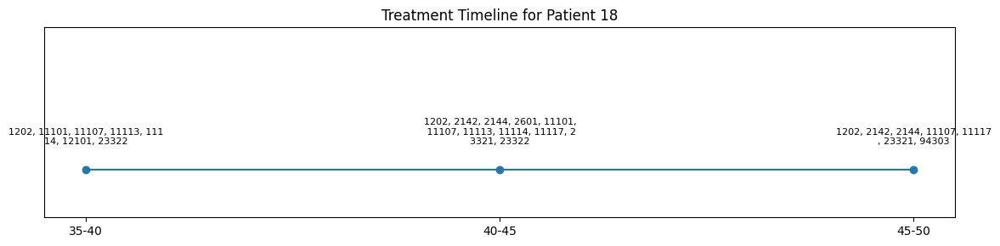

In [43]:
patient_id = list(trajectories.keys())[3]  # Pick one patient
visualize_patient_timeline(patient_id, trajectories[patient_id])